In [9]:
#Architecture has Autoencoder with Skip Connections. 
#Loss function is MSE Loss
#Optimizer is Adam.

#Qualitative results feel: It feels like Architecture is just copying information from decoder side to the encoder side.
#Architectural Results feel: The convolutional layers in the encoder are not too complex and hence not learning features. 
#Next Strategy to check: Autoencoder without Skip Connections.
import os
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score
from tqdm import tqdm

In [2]:
class MVTecLOCODataset(Dataset):
    def __init__(self, root_dir, split="train", transform=None):
        """
        Args:
            root_dir (string): Directory with all the images.
            split (string): One of 'train' or 'test'. Determines which folder to load.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.split = split
        self.transform = transform
        
        # Define the path for the good images based on the split
        if self.split == "train":
            self.image_dir = os.path.join(self.root_dir, "train", "good")
        elif self.split == "test":
            self.image_dir = os.path.join(self.root_dir, "test", "good")
        elif self.split == "test2":
            self.image_dir = os.path.join(self.root_dir, "test", "logical_anomalies")
        else:
            raise ValueError("Split must be either 'train' or 'test'")
        
        # List all image files in the directory
        self.image_files = [f for f in os.listdir(self.image_dir) if f.endswith(".png")]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Load the image
        img_name = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(img_name).convert("RGB")  # Assuming 3-channel images

        if self.transform:
            image = self.transform(image)

        return image

# Example usage
if __name__ == "__main__":
    # Define any transformations you want to apply (e.g., resizing, normalizing, etc.)
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
    ])
    
    # Initialize dataset for training images
    train_dataset = MVTecLOCODataset(root_dir="/home/hafiz/my_thesis/seg_recons/dataset/screw_bag", split="train", transform=transform)
    
    # Initialize dataset for test images
    test_dataset = MVTecLOCODataset(root_dir="/home/hafiz/my_thesis/seg_recons/dataset/screw_bag", split="test", transform=transform)

    print(f"Number of training images: {len(train_dataset)}")
    print(f"Number of test images: {len(test_dataset)}")


Number of training images: 360
Number of test images: 122


In [3]:
class DCAE(nn.Module):
    def __init__(self, num_channels=3):
        super(DCAE, self).__init__()
        # Encoder
        self.encoder_conv1 = nn.Conv2d(num_channels, 32, 3, stride=2, padding=1)
        self.encoder_conv2 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.encoder_conv3 = nn.Conv2d(64, 128, 3, stride=2, padding=1)
        self.encoder_conv4 = nn.Conv2d(128, 128, 3, stride=2, padding=1)
        self.encoder_conv5 = nn.Conv2d(128, 16, 1)

        self.leaky_relu = nn.LeakyReLU(inplace=True)

        # Fully connected layers
        self.fc1 = nn.Linear(16 * 64 * 64, 512)
        self.fc2 = nn.Linear(512, 16 * 64 * 64)

        # Decoder
        self.decoder_deconv1 = nn.ConvTranspose2d(16, 128, 3, stride=2, padding=1, output_padding=1)
        self.decoder_deconv2 = nn.ConvTranspose2d(128, 128, 3, stride=2, padding=1, output_padding=1)
        self.decoder_deconv3 = nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1)
        self.decoder_deconv4 = nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1)
        self.decoder_deconv5 = nn.Conv2d(32, num_channels, 1)

    def forward(self, x):
        # Encoder
        x1 = self.leaky_relu(self.encoder_conv1(x))   # (batch_size, 32, 512, 512)
        x2 = self.leaky_relu(self.encoder_conv2(x1))  # (batch_size, 64, 256, 256)
        x3 = self.leaky_relu(self.encoder_conv3(x2))  # (batch_size, 128, 128, 128)
        x4 = self.leaky_relu(self.encoder_conv4(x3))  # (batch_size, 128, 64, 64)
        x5 = self.leaky_relu(self.encoder_conv5(x4))  # (batch_size, 16, 64, 64)

        # Flatten and bottleneck
        x_flat = x5.view(x.size(0), -1)
        x_flat = self.leaky_relu(self.fc1(x_flat))    # (batch_size, 512)
        x_flat = self.leaky_relu(self.fc2(x_flat))    # (batch_size, 16 * 64 * 64)

        # Reshape to image dimensions
        x_unflat = x_flat.view(x.size(0), 16, 64, 64)

        # Decoder with skip connections
        x_unflat = self.leaky_relu(self.decoder_deconv1(x_unflat))  # (batch_size, 128, 128, 128)

        # Upsample x4
        x4_upsampled = nn.functional.interpolate(x4, size=(128, 128), mode='bilinear')

        # Add skip connection and pass through next deconvolution
        x_unflat = self.leaky_relu(self.decoder_deconv2(x_unflat + x4_upsampled))  # (batch_size, 128, 256, 256)

        # Upsample x3
        x3_upsampled = nn.functional.interpolate(x3, size=(256, 256), mode='bilinear')

        # Add skip connection
        x_unflat = self.leaky_relu(self.decoder_deconv3(x_unflat + x3_upsampled))  # (batch_size, 64, 512, 512)

        # Upsample x2
        x2_upsampled = nn.functional.interpolate(x2, size=(512, 512), mode='bilinear')

        # Add skip connection
        x_unflat = self.leaky_relu(self.decoder_deconv4(x_unflat + x2_upsampled))  # (batch_size, 32, 1024, 1024)

        # Upsample x1
        x1_upsampled = nn.functional.interpolate(x1, size=(1024, 1024), mode='bilinear')

        # Add skip connection and output layer
        x_unflat = self.decoder_deconv5(x_unflat + x1_upsampled)  # (batch_size, num_channels, 1024, 1024)

        return x_unflat

In [4]:
def evaluate(model, dataloader, device, threshold=None):
    """
    Evaluates the model by computing reconstruction errors and classifying images as normal or anomalous.

    Args:
        model: The trained autoencoder model.
        dataloader: Dataloader containing the evaluation images.
        device: Device to perform computations on (CPU or GPU).
        threshold: The reconstruction error threshold to classify images as anomalies. 
                   If None, it will only return reconstruction errors without classification.

    Returns:
        A tuple of (reconstruction_errors, predictions), where:
            - reconstruction_errors is a list of reconstruction errors for each image.
            - predictions is a list of 0s and 1s indicating normal (0) or anomalous (1) classification,
              or None if no threshold is provided.
    """
    model.eval()
    all_scores = []

    with torch.no_grad():
        for images in dataloader:
            images = images.to(device)

            # Forward pass
            reconstructed = model(images)

            # Compute per-sample reconstruction error (MSE)
            reconstruction_error = nn.functional.mse_loss(reconstructed, images, reduction='none')
            reconstruction_error = reconstruction_error.view(reconstruction_error.size(0), -1)
            reconstruction_error = reconstruction_error.mean(dim=1)

            # Collect reconstruction scores
            all_scores.extend(reconstruction_error.cpu().numpy())

    # Classify as normal or anomalous based on the threshold
    if threshold is not None:
        predictions = [1 if score > threshold else 0 for score in all_scores]
    else:
        predictions = None

    return all_scores, predictions

In [5]:
def visualize(model, dataloader, device, num_images=4, save_path=None, show_error=False):
    """
    Visualizes the original and reconstructed images from the autoencoder.

    Args:
        model: The trained autoencoder model.
        dataloader: Dataloader containing the images to visualize.
        device: Device to perform computations on (CPU or GPU).
        num_images: Number of images to visualize (default is 4).
        save_path: If provided, saves the visualization to the specified path.
        show_error: If True, displays the reconstruction error for each image.
    """
    model.eval()
    images = next(iter(dataloader))
    images = images.to(device)

    with torch.no_grad():
        reconstructed_image = model(images)

    # Convert to NumPy and transpose dimensions for visualization (batch, height, width, channels)
    images = images.cpu().numpy().transpose(0, 2, 3, 1)
    reconstructed_image = reconstructed_image.cpu().numpy().transpose(0, 2, 3, 1)

    # Rescale images from [-1, 1] to [0, 1]
    images = (images * 0.5) + 0.5
    reconstructed_image = (reconstructed_image * 0.5) + 0.5

    # Clip values to ensure valid image range
    images = np.clip(images, 0, 1)
    reconstructed_image = np.clip(reconstructed_image, 0, 1)

    # Compute reconstruction error if needed
    if show_error:
        reconstruction_error = np.mean((images - reconstructed_image) ** 2, axis=(1, 2, 3))

    # Limit to specified number of images
    n = min(len(images), num_images)
    plt.figure(figsize=(18, 8))
    for i in range(n):
        # Original Image
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(images[i])
        ax.axis('off')
        ax.set_title("Original Image")

        # Reconstructed Image
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_image[i])
        ax.axis('off')
        title = "Reconstructed Image"
        if show_error:
            title += f"\nReconstruction Error: {reconstruction_error[i]:.4f}"
        ax.set_title(title)

    # Save or display the plot
    if save_path:
        plt.savefig(save_path)
        print(f"Visualization saved to {save_path}")
    else:
        plt.show()

    plt.close()

# # Visualize 6 images and display reconstruction errors
# visualize(model, dataloader, device, num_images=6, show_error=True)

# # Save the visualization to a file
# visualize(model, dataloader, device, num_images=4, save_path="reconstruction_visualization.png")


In [6]:
def train(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    progress_bar = tqdm(train_loader, desc="Training", unit="batch")

    for images in progress_bar:
        images = images.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        reconstructed = model(images)
        loss = criterion(reconstructed, images)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        # Accumulate the loss
        total_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    return total_loss / len(train_loader)

No checkpoint found at 'checkpoint.pth'


Training: 100%|██████████| 45/45 [00:51<00:00,  1.14s/batch, loss=0.0887]


Epoch 1/500, Train Loss: 0.280326, Mean Reconstruction Error: 0.0836, Anomalous: 0, Normal: 122
Epoch 1/500, Train Loss: 0.280326, Mean Reconstruction Error: 0.0837, Anomalous: 0, Normal: 137


Training: 100%|██████████| 45/45 [00:50<00:00,  1.12s/batch, loss=0.0206]


Epoch 2/500, Train Loss: 0.039807, Mean Reconstruction Error: 0.0199, Anomalous: 0, Normal: 122
Epoch 2/500, Train Loss: 0.039807, Mean Reconstruction Error: 0.0198, Anomalous: 0, Normal: 137


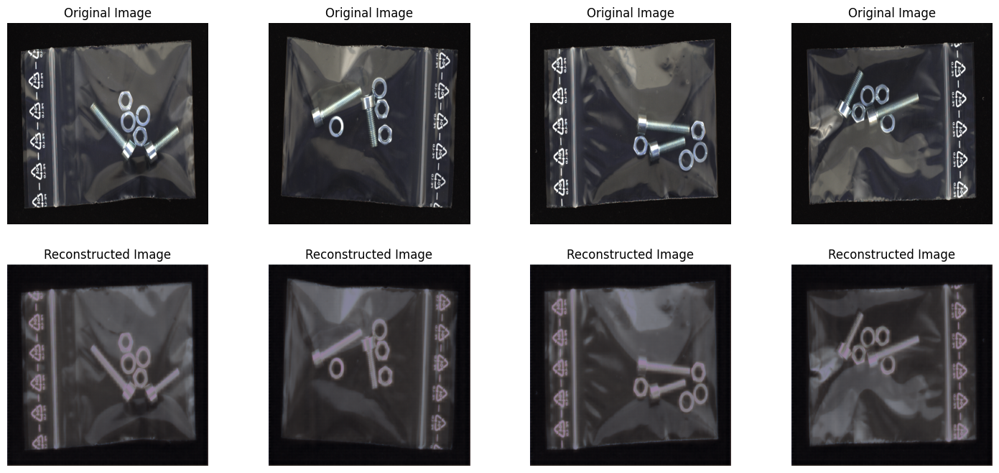

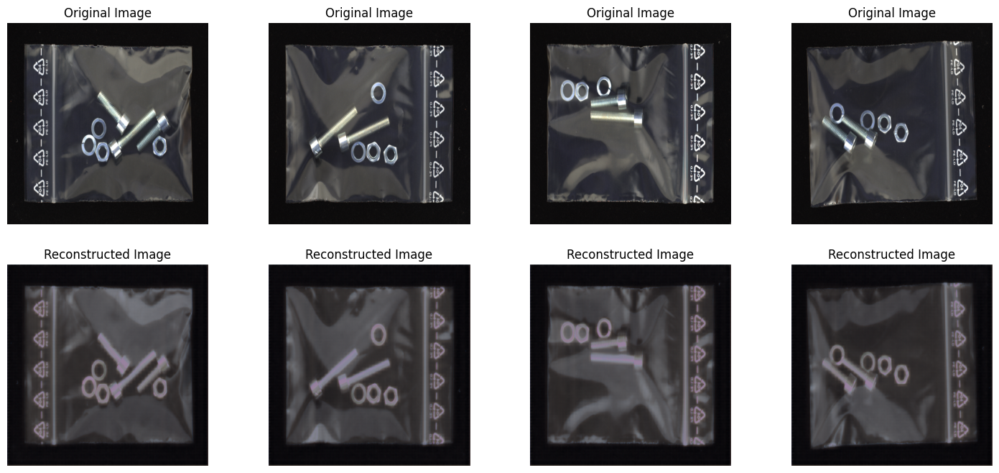

Training: 100%|██████████| 45/45 [00:51<00:00,  1.14s/batch, loss=0.0115]


Epoch 3/500, Train Loss: 0.015333, Mean Reconstruction Error: 0.0111, Anomalous: 0, Normal: 122
Epoch 3/500, Train Loss: 0.015333, Mean Reconstruction Error: 0.0110, Anomalous: 0, Normal: 137


Training: 100%|██████████| 45/45 [00:49<00:00,  1.11s/batch, loss=0.00703]


Epoch 4/500, Train Loss: 0.008816, Mean Reconstruction Error: 0.0070, Anomalous: 0, Normal: 122
Epoch 4/500, Train Loss: 0.008816, Mean Reconstruction Error: 0.0069, Anomalous: 0, Normal: 137


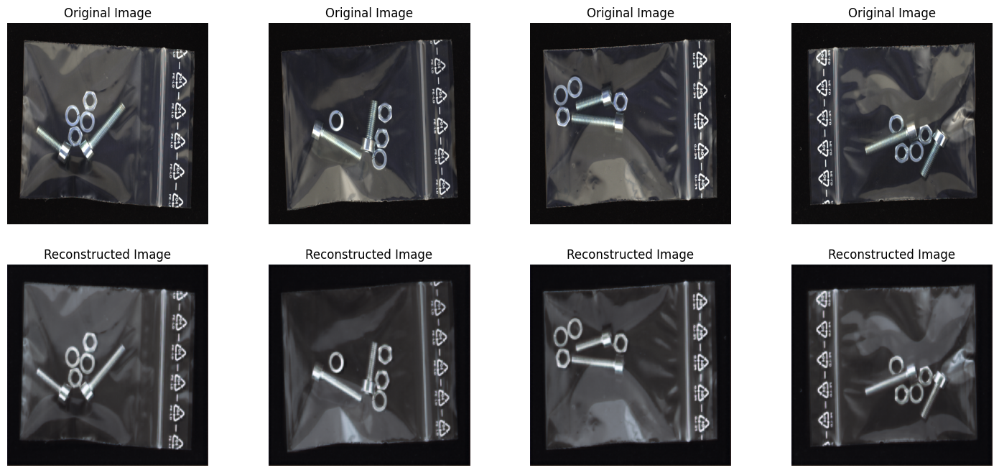

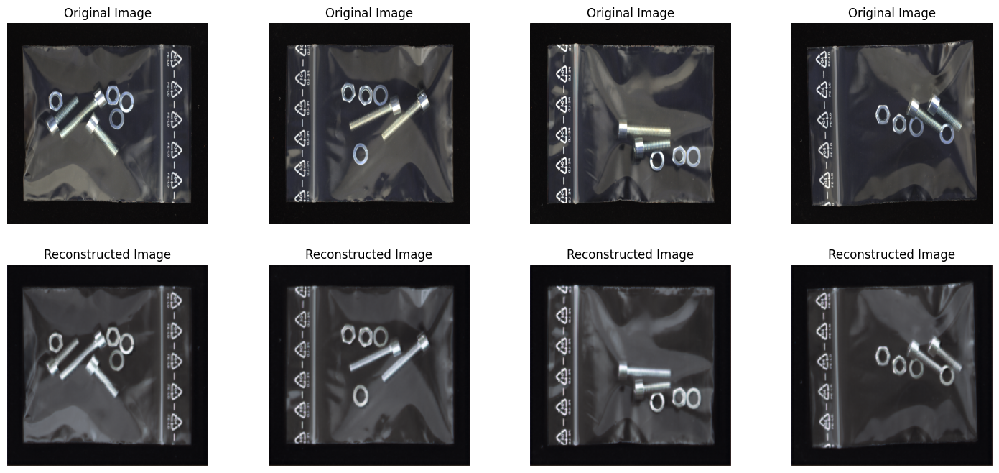

Training: 100%|██████████| 45/45 [00:50<00:00,  1.11s/batch, loss=0.00579]


Epoch 5/500, Train Loss: 0.006267, Mean Reconstruction Error: 0.0056, Anomalous: 0, Normal: 122
Epoch 5/500, Train Loss: 0.006267, Mean Reconstruction Error: 0.0055, Anomalous: 0, Normal: 137


Training: 100%|██████████| 45/45 [00:50<00:00,  1.12s/batch, loss=0.0052] 


Epoch 6/500, Train Loss: 0.005154, Mean Reconstruction Error: 0.0047, Anomalous: 0, Normal: 122
Epoch 6/500, Train Loss: 0.005154, Mean Reconstruction Error: 0.0046, Anomalous: 0, Normal: 137


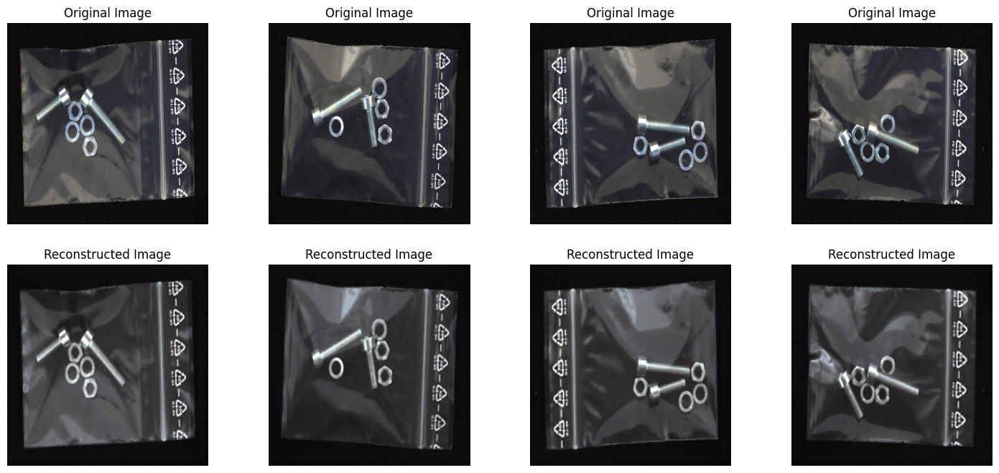

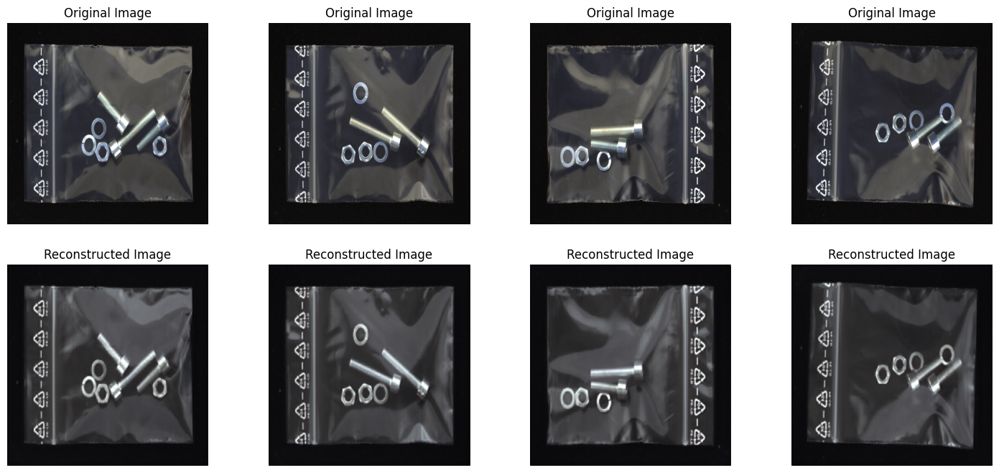

Training: 100%|██████████| 45/45 [00:50<00:00,  1.12s/batch, loss=0.0044] 


Epoch 7/500, Train Loss: 0.004399, Mean Reconstruction Error: 0.0041, Anomalous: 0, Normal: 122
Epoch 7/500, Train Loss: 0.004399, Mean Reconstruction Error: 0.0040, Anomalous: 0, Normal: 137


Training: 100%|██████████| 45/45 [00:50<00:00,  1.12s/batch, loss=0.00379]


Epoch 8/500, Train Loss: 0.003878, Mean Reconstruction Error: 0.0037, Anomalous: 0, Normal: 122
Epoch 8/500, Train Loss: 0.003878, Mean Reconstruction Error: 0.0036, Anomalous: 0, Normal: 137


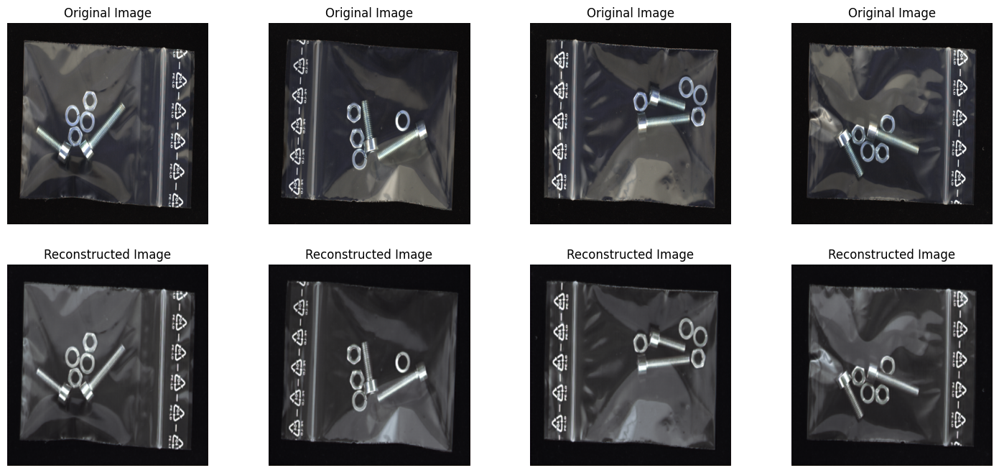

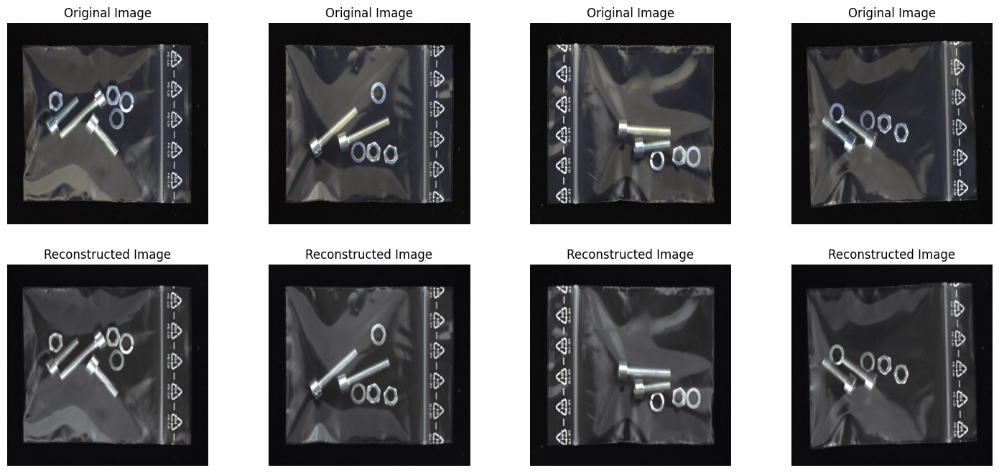

Training: 100%|██████████| 45/45 [00:48<00:00,  1.08s/batch, loss=0.00354]


Epoch 9/500, Train Loss: 0.003502, Mean Reconstruction Error: 0.0033, Anomalous: 0, Normal: 122
Epoch 9/500, Train Loss: 0.003502, Mean Reconstruction Error: 0.0033, Anomalous: 0, Normal: 137


Training: 100%|██████████| 45/45 [00:48<00:00,  1.08s/batch, loss=0.00288]


Epoch 10/500, Train Loss: 0.003198, Mean Reconstruction Error: 0.0031, Anomalous: 0, Normal: 122
Epoch 10/500, Train Loss: 0.003198, Mean Reconstruction Error: 0.0030, Anomalous: 0, Normal: 137


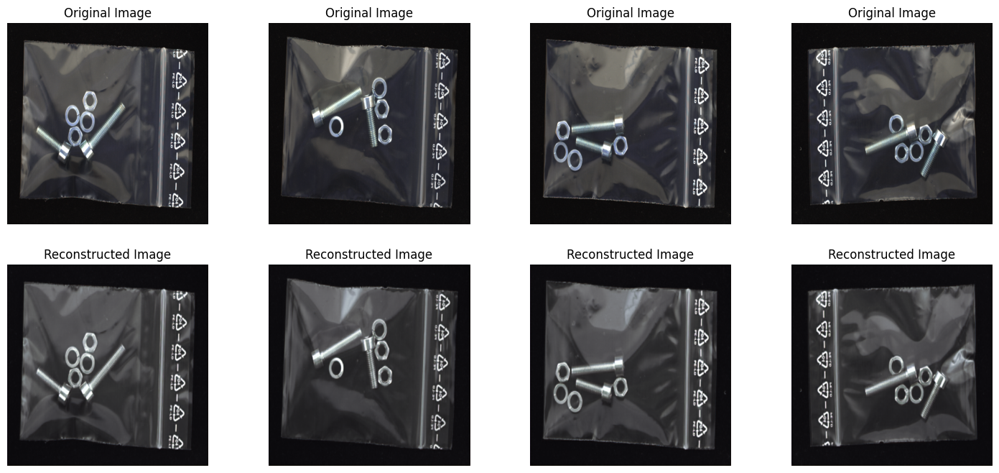

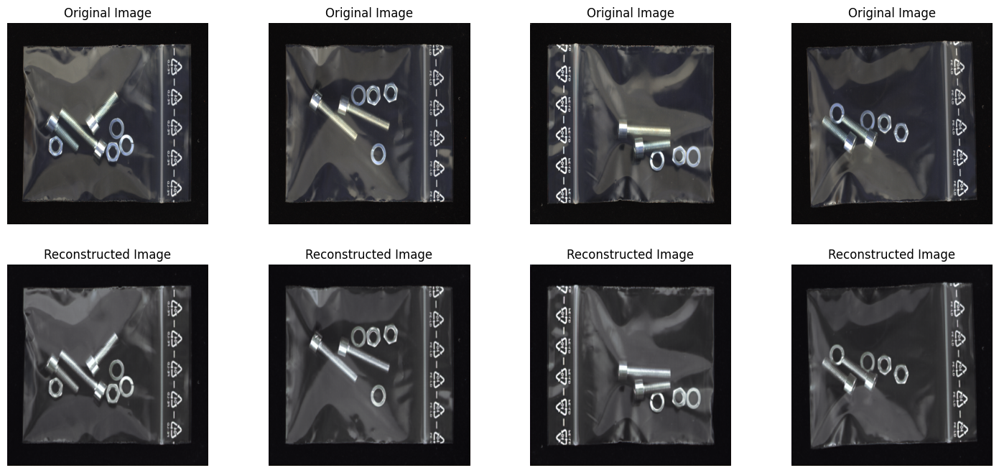

Training: 100%|██████████| 45/45 [00:49<00:00,  1.10s/batch, loss=0.00273]


Epoch 11/500, Train Loss: 0.002944, Mean Reconstruction Error: 0.0028, Anomalous: 0, Normal: 122
Epoch 11/500, Train Loss: 0.002944, Mean Reconstruction Error: 0.0028, Anomalous: 0, Normal: 137


Training: 100%|██████████| 45/45 [00:49<00:00,  1.10s/batch, loss=0.00261]


Epoch 12/500, Train Loss: 0.002705, Mean Reconstruction Error: 0.0026, Anomalous: 0, Normal: 122
Epoch 12/500, Train Loss: 0.002705, Mean Reconstruction Error: 0.0025, Anomalous: 0, Normal: 137


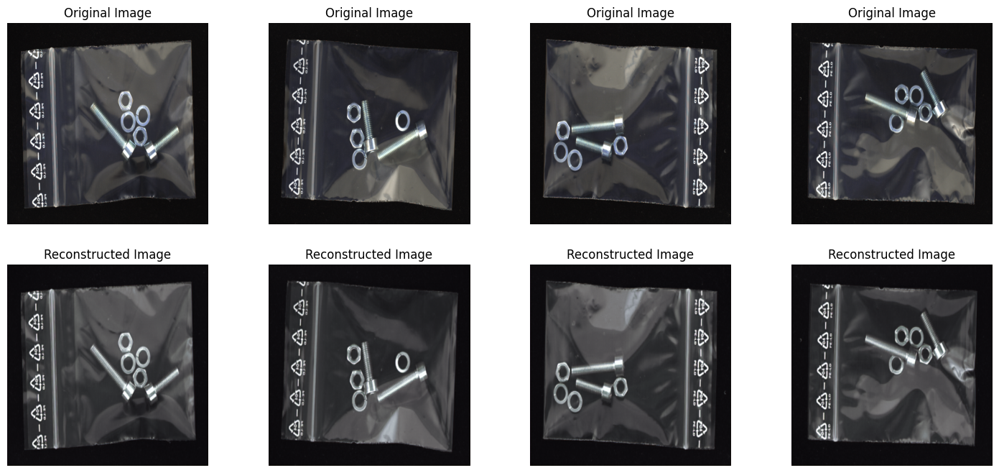

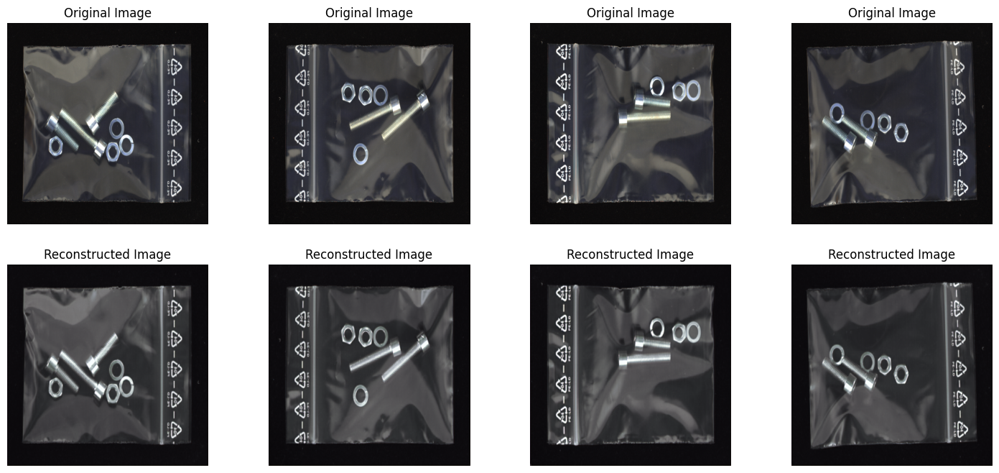

Training: 100%|██████████| 45/45 [00:48<00:00,  1.07s/batch, loss=0.00237]


Epoch 13/500, Train Loss: 0.002483, Mean Reconstruction Error: 0.0024, Anomalous: 0, Normal: 122
Epoch 13/500, Train Loss: 0.002483, Mean Reconstruction Error: 0.0023, Anomalous: 0, Normal: 137


Training: 100%|██████████| 45/45 [00:47<00:00,  1.07s/batch, loss=0.00223]


Epoch 14/500, Train Loss: 0.002295, Mean Reconstruction Error: 0.0022, Anomalous: 0, Normal: 122
Epoch 14/500, Train Loss: 0.002295, Mean Reconstruction Error: 0.0022, Anomalous: 0, Normal: 137


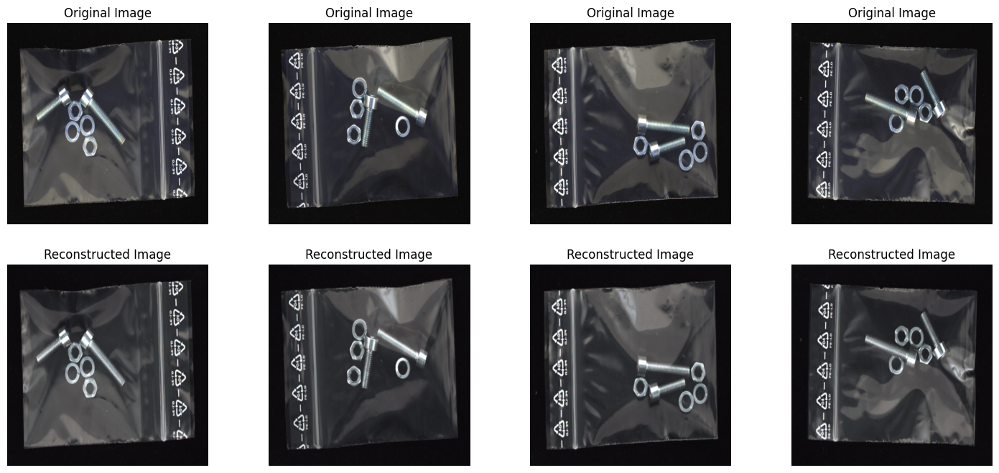

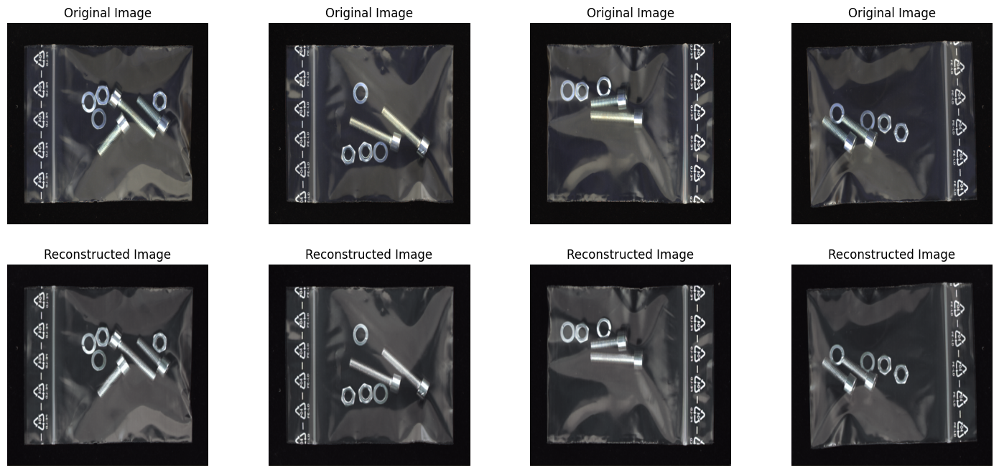

Training:  31%|███       | 14/45 [00:16<00:36,  1.17s/batch, loss=0.00213]


KeyboardInterrupt: 

In [7]:
def save_checkpoint(epoch, model, optimizer, checkpoint_path):
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }, checkpoint_path)
    print(f"Checkpoint saved at '{checkpoint_path}'")

def load_checkpoint(checkpoint_path, model, optimizer, device):
    if os.path.isfile(checkpoint_path):
        print(f"Loading checkpoint from '{checkpoint_path}'")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint['epoch'] + 1
        print(f"Resuming training from epoch {start_epoch}")
        return start_epoch
    else:
        print(f"No checkpoint found at '{checkpoint_path}'")
        return 0

def main():
    # Hyperparameters
    img_size = 1024
    num_channels = 3
    batch_size = 8
    num_epochs = 500
    learning_rate = 1e-4
    ROOT_DIR = "/home/hafiz/my_thesis/seg_recons/dataset/screw_bag"
    device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')

    # Data Transformations
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5] * 3, std=[0.5] * 3),
    ])

    # Datasets and Data Loaders
    train_dataset = MVTecLOCODataset(root_dir=ROOT_DIR, split='train', transform=transform)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = MVTecLOCODataset(root_dir=ROOT_DIR, split='test', transform=transform)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    test_dataset2 = MVTecLOCODataset(root_dir=ROOT_DIR, split='test2', transform=transform)
    test_loader2 = DataLoader(test_dataset2, batch_size=batch_size, shuffle=False)

    model = DCAE(num_channels=num_channels).to(device)

    # Optimizer and Loss Function
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss(reduction='mean')

    # Load checkpoint if available
    checkpoint_path = 'checkpoint.pth'
    start_epoch = load_checkpoint(checkpoint_path, model, optimizer, device)

    # Training Loop
    for epoch in range(start_epoch, num_epochs):
        # Train
        train_loss = train(model, train_loader, optimizer, criterion, device)

        # Evaluate
        all_scores, predictions = evaluate(model, test_loader, device, threshold=0.7)
        # Print a summary instead of the entire list
        mean_score = sum(all_scores) / len(all_scores) if all_scores else 0
        prediction_summary = f"Anomalous: {predictions.count(1)}, Normal: {predictions.count(0)}" if predictions else "No predictions"
        print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.6f}, Mean Reconstruction Error: {mean_score:.4f}, {prediction_summary}")

        all_scores2, predictions2 = evaluate(model, test_loader2, device, threshold=0.7)
        mean_score2 = sum(all_scores2) / len(all_scores2) if all_scores2 else 0
        prediction_summary2 = f"Anomalous: {predictions2.count(1)}, Normal: {predictions2.count(0)}" if predictions2 else "No predictions"
        print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.6f}, Mean Reconstruction Error: {mean_score2:.4f}, {prediction_summary2}")

        # Visualize every 5 epochs
        if (epoch + 1) % 2 == 0:
            visualize(model, test_loader, device, num_images=4)
            visualize(model, test_loader2, device, num_images=4)

        # Save checkpoint every 25 epochs
        if (epoch + 1) % 25 == 0:
            save_checkpoint(epoch, model, optimizer, f'checkpoint_epoch_{epoch + 1}.pth')

    # Save final model
    save_checkpoint(num_epochs, model, optimizer, 'model_final.pth')

if __name__ == "__main__":
    main()
